In [1]:
import os, json, yaml
import random, shutil
import pandas as pd
from pathlib import Path
from PIL import Image, ImageDraw

while ".git" not in os.listdir(os.getcwd()): prj_dir = os.chdir(Path(os.getcwd())/"..")

from utils.boxes import xywh2xy_xy, rxywh2xywh

base_folder = Path("data/unified/yolo-sets")

In [2]:
name = "self-svd"
folders = [base_folder/name/"val", base_folder/name/"train"]

In [3]:
ids = set([fi.stem for f in folders for fi in f.glob('*')])

00008


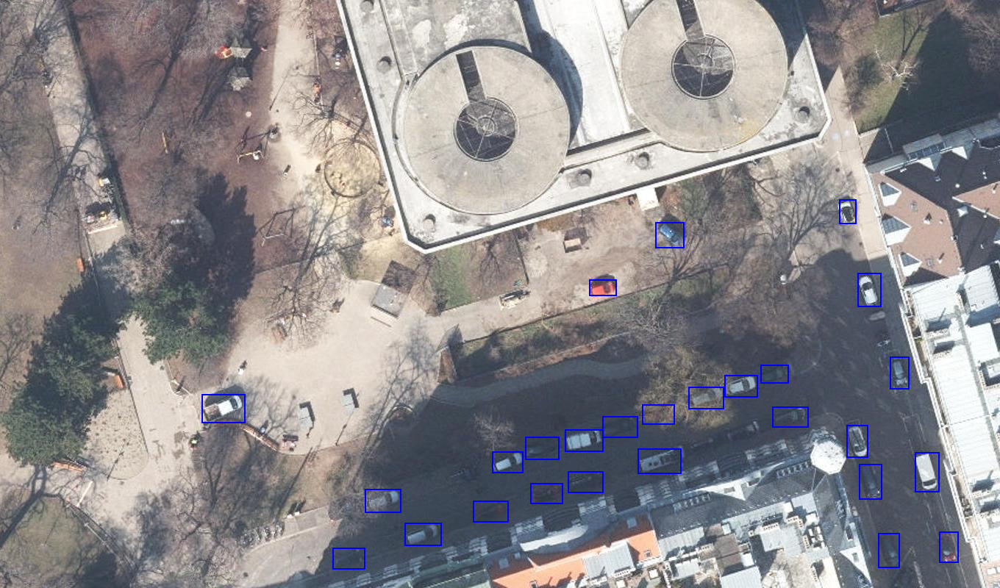

00073


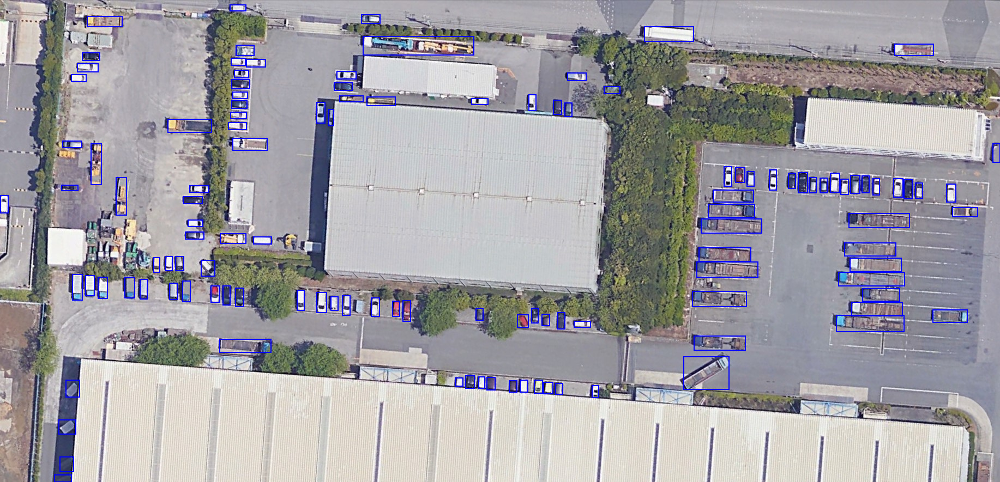

00004


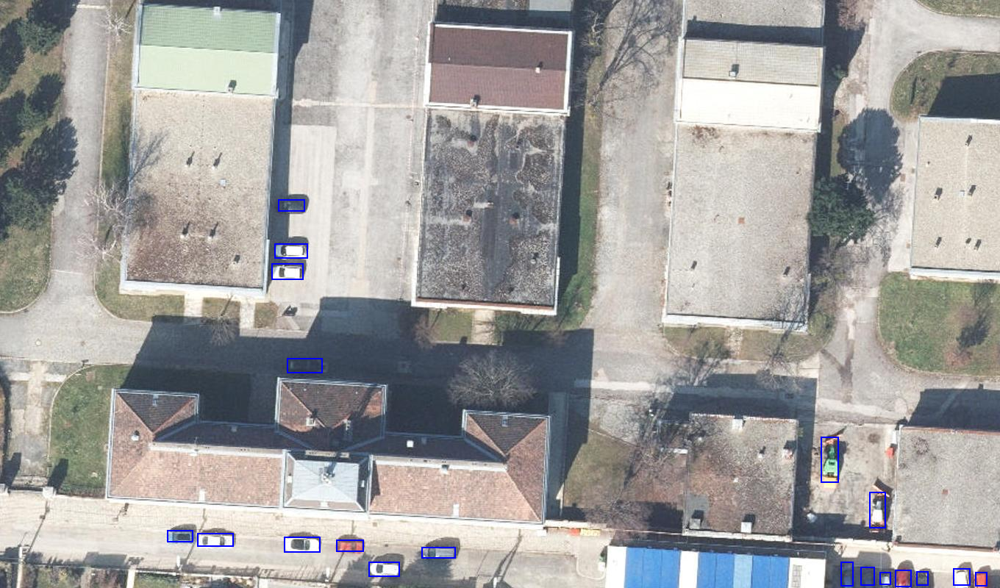

00044


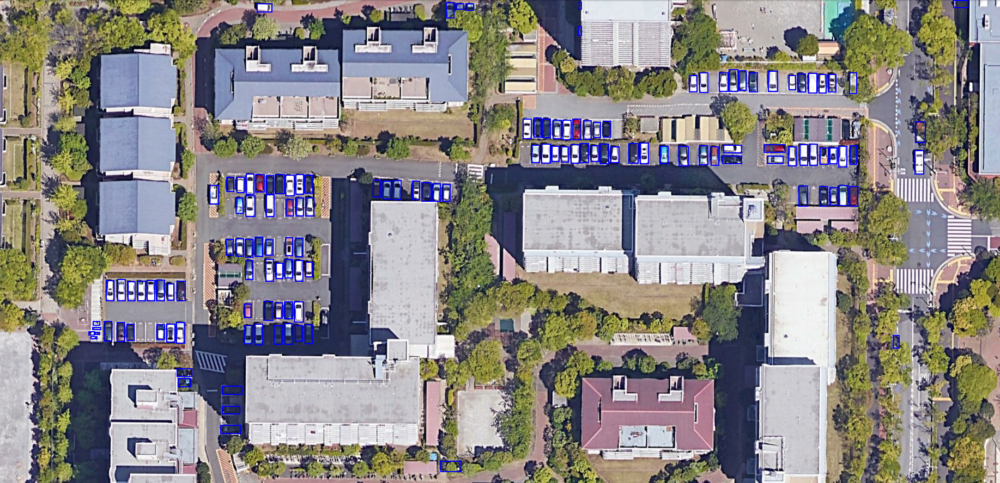

00002


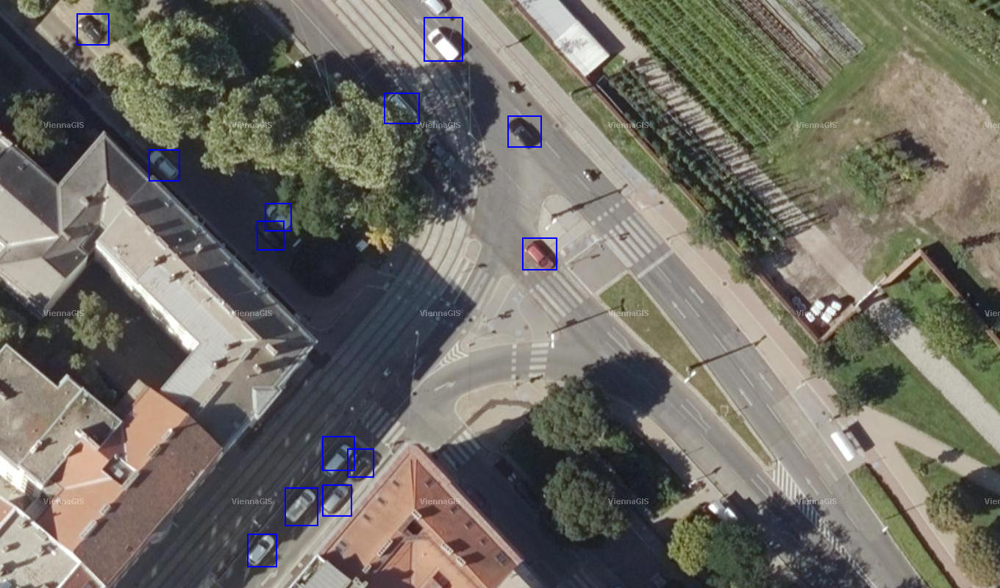

In [6]:
# def center2rect(center):
#     return ((center[0] - 2, center[1] - 2), (center[0] + 2, center[1] + 2))
    
def drawTest(i):
    folder = None
    for f in folders:
        if (f/f"{i}.jpg").is_file():
            folder = f
            break
    
    img = Image.open(folder/f"{i}.jpg")
    draw = ImageDraw.Draw(img)

    try:
        annos = pd.read_csv(folder/f"{i}.txt", sep=" ", header=None)

        for index, row in annos.iterrows():
            bbox = rxywh2xywh(row[1:5].values, img.size)
            draw.rectangle(xywh2xy_xy(bbox), outline="blue",  width=2)
    except Exception as e:
        print(f"{i}: {e}")
    
    display(img)    

show_ids = list(ids)
random.shuffle(show_ids)
show_ids = show_ids[:5]
# show_ids = ['00038', '00104']

for i in show_ids:
    print(i)
    drawTest(i)